# IoT Identification: Part 2
1. Distribution mapping
2. Correlation mapping
3. Model building

Coming in from part 1 where we left off just after preprocessing our binomials and checking our data's relationships with itself and our target variable, we now want to get an overview on the distribution of our data. Remember that in the last part we log transformed our dataset because judging by its summary statistics, there was some heavy skew (most of the features had their median >>> mean, and the difference in data values from the 90th percentile to the 99th percentile was massive.) 

A gentle reminder: always remember to standardise your data before boxplotting it (or using any variant of a boxplot.) Also quite interestingly, the 8th feature plays well with a violinplot even though a KDE is created for it.

Scaled & logged data violins:
------------------------------


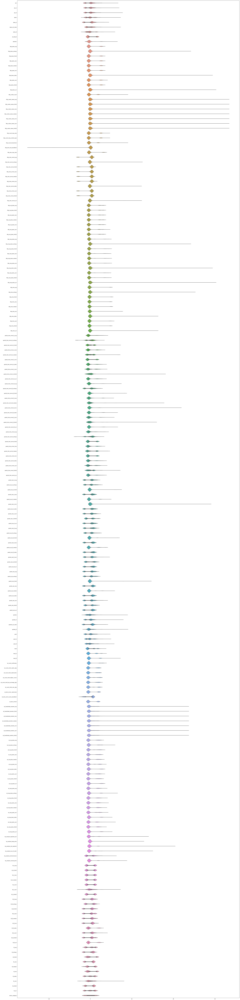

In [22]:
# it is probably more prudent to use StandardScaler() here due to its function
# persistence, but we're still a ways away from finalising our dataset after
# preprocessing and a quick standardisation will suffice for what our current
# purpose is: violin plotting.

fig, axes = plt.subplots(figsize=(45, 207))
sns.violinplot(data = stats.zscore(df_3d), orient = "h");

print("Scaled & logged data violins:")
print("------------------------------")

The log transformation helped most of our data come into a somewhat normal distribution but there are still a few funky columns that we should probably take a look at.

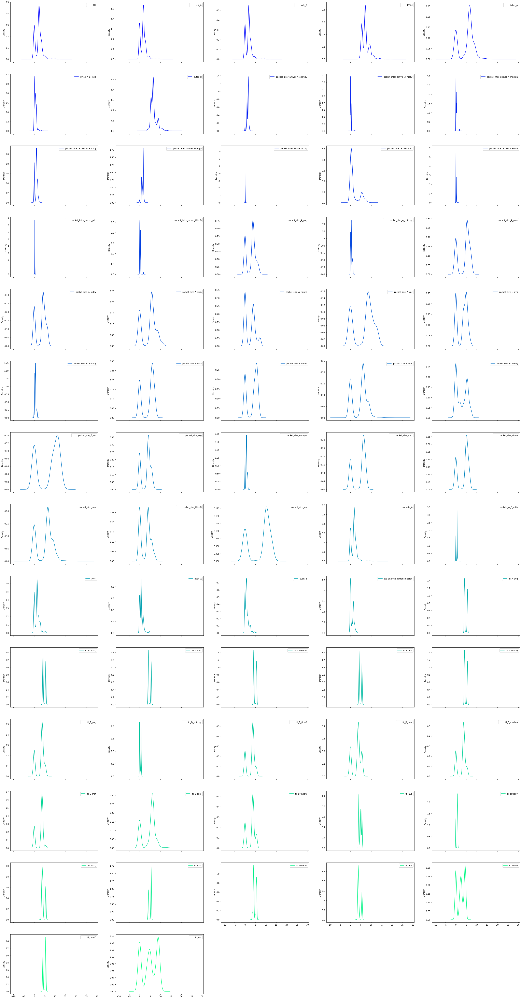

In [23]:
f_cols = ["ack", "ack_A", "ack_B", "bytes", "bytes_A", "bytes_A_B_ratio",
          "bytes_B", "packet_inter_arrivel_A_entropy",
          "packet_inter_arrivel_A_firstQ", "packet_inter_arrivel_A_median",
          "packet_inter_arrivel_B_entropy",
          "packet_inter_arrivel_entropy", "packet_inter_arrivel_firstQ",
          "packet_inter_arrivel_max", "packet_inter_arrivel_median",
          "packet_inter_arrivel_min", "packet_inter_arrivel_thirdQ",
          "packet_size_A_avg", "packet_size_A_entropy", "packet_size_A_max",
          "packet_size_A_stdev", "packet_size_A_sum", "packet_size_A_thirdQ",
          "packet_size_A_var", "packet_size_B_avg", "packet_size_B_entropy",
          "packet_size_B_max", "packet_size_B_stdev", "packet_size_B_sum",
          "packet_size_B_thirdQ", "packet_size_B_var", "packet_size_avg",
          "packet_size_entropy", "packet_size_max", "packet_size_stdev",
          "packet_size_sum", "packet_size_thirdQ", "packet_size_var",
          "packets_A", "packets_A_B_ratio", "push", "push_A", "push_B",
          "tcp_analysis_retransmission", "ttl_A_avg", "ttl_A_firstQ",
          "ttl_A_max", "ttl_A_median", "ttl_A_min", "ttl_A_thirdQ",
          "ttl_B_avg", "ttl_B_entropy", "ttl_B_firstQ", "ttl_B_max",
          "ttl_B_median", "ttl_B_min", "ttl_B_sum", "ttl_B_thirdQ",
          "ttl_avg", "ttl_entropy", "ttl_firstQ", "ttl_max", "ttl_median",
          "ttl_min", "ttl_stdev", "ttl_thirdQ", "ttl_var"]

df_3d[f_cols].plot.kde(subplots = True, figsize = (45, 90),
                       layout = (14, 5), colormap = "winter");

Everything seems to be fine, some kind of scaling should help bring what seems to be kurtic features closer towards normality. let's now check out our data's QQ plots before we get into the model building.

Scaled & logged data QQplot:
------------------------------


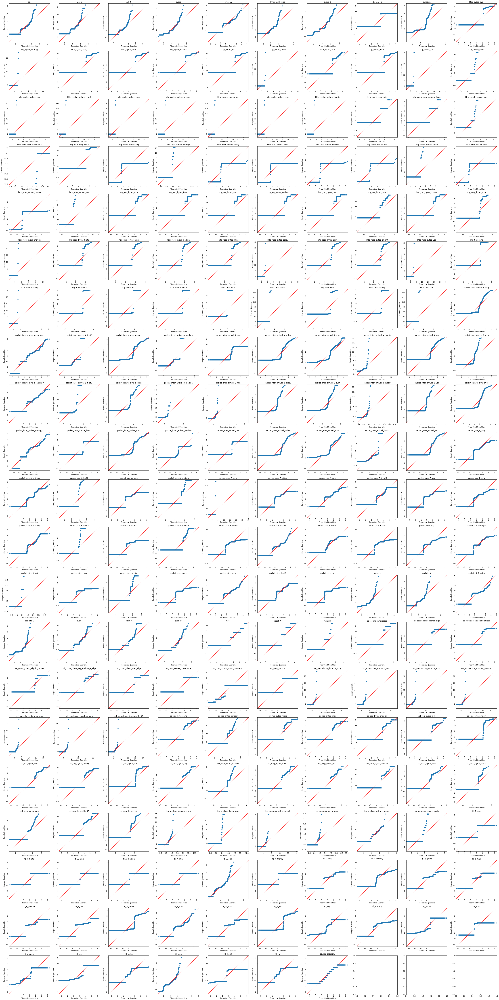

In [24]:
fig, axes = plt.subplots(ncols=10, nrows=21, figsize=(45, 90))

for col, ax in zip(df_3d.columns, np.ravel(axes)):
    sm.qqplot(stats.zscore(df_3d[col]), line = "45", ax = ax)
    ax.set_title(f"{col}")

print("Scaled & logged data QQplot:")
print("------------------------------")
plt.tight_layout()
plt.show()

This doesn't look *too* bad, regularisation should help a lot with the spread. Finally let's look at our correlations (which regularisation should help with as well.)

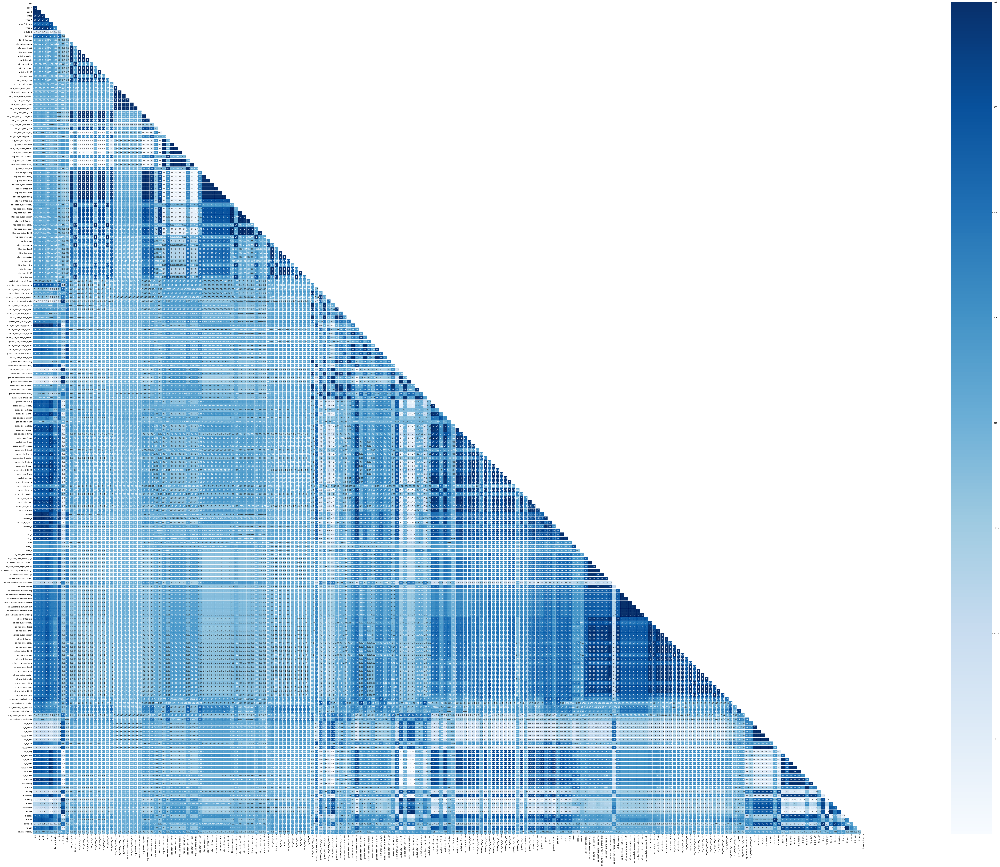

In [25]:
fig, ax = plt.subplots(figsize=(180, 90))
sns.heatmap(data = df_3d.corr(),
            cmap = "Blues",
            annot = True,
            fmt = ".1g",
            linewidths = 0.1,
            mask = np.triu(df_3d.corr()),
            square = True,
            ax = ax);

Our iceberg confirms what we suspected: statistical measures (\*\_avg, \*\_median, \*\_mode), which is what our dataframe's DNA is, sports some extreme correlations with other statistical measures. Regularisation should help tremendously here, but we can also try RFE after every model we build. Additionally, we can also try clustering: we can group the datapoints that are very close to each other (using dissimilarity based on correlation) and see if that helps.

Alright well it looks like we're about ready to go, let's concatenate all our dataframes together and go over a final check.  
`df_final = df_binom + df_3d[-"device_category"] + df_cp["device_category"]`

In [26]:
df_final = pd.concat([df_3d.drop("device_category", axis = 1),
                      df_binom,
                      df_cp["device_category"]],
                      axis = 1)
dm.data_viewer(df_final)


--------------------
Shape:
--------------------
(1900, 223)

--------------------
Head:
--------------------


,ack,ack_A,ack_B,bytes,bytes_A,bytes_A_B_ratio,bytes_B,ds_field_B,duration,http_bytes_avg,http_bytes_entropy,http_bytes_firstQ,http_bytes_max,http_bytes_median,http_bytes_min,http_bytes_stdev,http_bytes_sum,http_bytes_thirdQ,http_bytes_var,http_cookie_count,http_cookie_values_avg,http_cookie_values_firstQ,http_cookie_values_max,http_cookie_values_median,http_cookie_values_min,http_cookie_values_sum,http_cookie_values_thirdQ,http_count_resp_code,http_count_resp_content_type,http_count_transactions,http_dom_host_alexaRank,http_dom_resp_code,http_inter_arrivel_avg,http_inter_arrivel_entropy,http_inter_arrivel_firstQ,http_inter_arrivel_max,http_inter_arrivel_median,http_inter_arrivel_min,http_inter_arrivel_stdev,http_inter_arrivel_sum,http_inter_arrivel_thirdQ,http_inter_arrivel_var,http_req_bytes_avg,http_req_bytes_firstQ,http_req_bytes_max,http_req_bytes_median,http_req_bytes_min,http_req_bytes_sum,http_req_bytes_thirdQ,http_resp_bytes_avg,http_resp_bytes_entropy,http_resp_bytes_firstQ,http_resp_bytes_max,http_resp_bytes_median,http_resp_bytes_min,http_resp_bytes_stdev,http_resp_bytes_sum,http_resp_bytes_thirdQ,http_resp_bytes_var,http_time_avg,http_time_entropy,http_time_firstQ,http_time_max,http_time_median,http_time_min,http_time_stdev,http_time_sum,http_time_thirdQ,http_time_var,packet_inter_arrivel_A_avg,packet_inter_arrivel_A_entropy,packet_inter_arrivel_A_firstQ,packet_inter_arrivel_A_max,packet_inter_arrivel_A_median,packet_inter_arrivel_A_min,packet_inter_arrivel_A_stdev,packet_inter_arrivel_A_sum,packet_inter_arrivel_A_thirdQ,packet_inter_arrivel_A_var,packet_inter_arrivel_B_avg,packet_inter_arrivel_B_entropy,packet_inter_arrivel_B_firstQ,packet_inter_arrivel_B_max,packet_inter_arrivel_B_median,packet_inter_arrivel_B_min,packet_inter_arrivel_B_stdev,packet_inter_arrivel_B_sum,packet_inter_arrivel_B_thirdQ,packet_inter_arrivel_B_var,packet_inter_arrivel_avg,packet_inter_arrivel_entropy,packet_inter_arrivel_firstQ,packet_inter_arrivel_max,packet_inter_arrivel_median,packet_inter_arrivel_min,packet_inter_arrivel_stdev,packet_inter_arrivel_sum,packet_inter_arrivel_thirdQ,packet_inter_arrivel_var,packet_size_A_avg,packet_size_A_entropy,packet_size_A_firstQ,packet_size_A_max,packet_size_A_median,packet_size_A_min,packet_size_A_stdev,packet_size_A_sum,packet_size_A_thirdQ,packet_size_A_var,packet_size_B_avg,packet_size_B_entropy,packet_size_B_firstQ,packet_size_B_max,packet_size_B_median,packet_size_B_stdev,packet_size_B_sum,packet_size_B_thirdQ,packet_size_B_var,packet_size_avg,packet_size_entropy,packet_size_firstQ,packet_size_max,packet_size_median,packet_size_stdev,packet_size_sum,packet_size_thirdQ,packet_size_var,packets,packets_A,packets_A_B_ratio,packets_B,push,push_A,push_B,reset,reset_A,reset_B,ssl_count_certificates,ssl_count_client_cipher_algs,ssl_count_client_ciphersuites,ssl_count_client_elliptic_curves,ssl_count_client_key_exchange_algs,ssl_count_client_mac_algs,ssl_dom_server_ciphersuite,ssl_dom_server_name_alexaRank,ssl_dom_version,ssl_handshake_duration_avg,ssl_handshake_duration_firstQ,ssl_handshake_duration_max,ssl_handshake_duration_median,ssl_handshake_duration_min,ssl_handshake_duration_sum,ssl_handshake_duration_thirdQ,ssl_req_bytes_avg,ssl_req_bytes_entropy,ssl_req_bytes_firstQ,ssl_req_bytes_max,ssl_req_bytes_median,ssl_req_bytes_min,ssl_req_bytes_stdev,ssl_req_bytes_sum,ssl_req_bytes_thirdQ,ssl_req_bytes_var,ssl_resp_bytes_avg,ssl_resp_bytes_entropy,ssl_resp_bytes_firstQ,ssl_resp_bytes_max,ssl_resp_bytes_median,ssl_resp_bytes_min,ssl_resp_bytes_stdev,ssl_resp_bytes_sum,ssl_resp_bytes_thirdQ,ssl_resp_bytes_var,tcp_analysis_duplicate_ack,tcp_analysis_keep_alive,tcp_analysis_lost_segment,tcp_analysis_out_of_order,tcp_analysis_retransmission,tcp_analysis_reused_ports,ttl_A_avg,ttl_A_firstQ,ttl_A_max,ttl_A_median,ttl_A_min,ttl_A_sum,ttl_A_thirdQ,ttl_B_avg,ttl_B_entropy,ttl_B_firstQ,ttl_B_max,ttl_B_median,ttl_B_min,ttl_B_stdev,ttl_B_sum,ttl_B_thirdQ,ttl_B_var,ttl_avg,ttl_entropy,ttl_firstQ,ttl_max,ttl_medi


--------------------
Tail:
--------------------


,ack,ack_A,ack_B,bytes,bytes_A,bytes_A_B_ratio,bytes_B,ds_field_B,duration,http_bytes_avg,http_bytes_entropy,http_bytes_firstQ,http_bytes_max,http_bytes_median,http_bytes_min,http_bytes_stdev,http_bytes_sum,http_bytes_thirdQ,http_bytes_var,http_cookie_count,http_cookie_values_avg,http_cookie_values_firstQ,http_cookie_values_max,http_cookie_values_median,http_cookie_values_min,http_cookie_values_sum,http_cookie_values_thirdQ,http_count_resp_code,http_count_resp_content_type,http_count_transactions,http_dom_host_alexaRank,http_dom_resp_code,http_inter_arrivel_avg,http_inter_arrivel_entropy,http_inter_arrivel_firstQ,http_inter_arrivel_max,http_inter_arrivel_median,http_inter_arrivel_min,http_inter_arrivel_stdev,http_inter_arrivel_sum,http_inter_arrivel_thirdQ,http_inter_arrivel_var,http_req_bytes_avg,http_req_bytes_firstQ,http_req_bytes_max,http_req_bytes_median,http_req_bytes_min,http_req_bytes_sum,http_req_bytes_thirdQ,http_resp_bytes_avg,http_resp_bytes_entropy,http_resp_bytes_firstQ,http_resp_bytes_max,http_resp_bytes_median,http_resp_bytes_min,http_resp_bytes_stdev,http_resp_bytes_sum,http_resp_bytes_thirdQ,http_resp_bytes_var,http_time_avg,http_time_entropy,http_time_firstQ,http_time_max,http_time_median,http_time_min,http_time_stdev,http_time_sum,http_time_thirdQ,http_time_var,packet_inter_arrivel_A_avg,packet_inter_arrivel_A_entropy,packet_inter_arrivel_A_firstQ,packet_inter_arrivel_A_max,packet_inter_arrivel_A_median,packet_inter_arrivel_A_min,packet_inter_arrivel_A_stdev,packet_inter_arrivel_A_sum,packet_inter_arrivel_A_thirdQ,packet_inter_arrivel_A_var,packet_inter_arrivel_B_avg,packet_inter_arrivel_B_entropy,packet_inter_arrivel_B_firstQ,packet_inter_arrivel_B_max,packet_inter_arrivel_B_median,packet_inter_arrivel_B_min,packet_inter_arrivel_B_stdev,packet_inter_arrivel_B_sum,packet_inter_arrivel_B_thirdQ,packet_inter_arrivel_B_var,packet_inter_arrivel_avg,packet_inter_arrivel_entropy,packet_inter_arrivel_firstQ,packet_inter_arrivel_max,packet_inter_arrivel_median,packet_inter_arrivel_min,packet_inter_arrivel_stdev,packet_inter_arrivel_sum,packet_inter_arrivel_thirdQ,packet_inter_arrivel_var,packet_size_A_avg,packet_size_A_entropy,packet_size_A_firstQ,packet_size_A_max,packet_size_A_median,packet_size_A_min,packet_size_A_stdev,packet_size_A_sum,packet_size_A_thirdQ,packet_size_A_var,packet_size_B_avg,packet_size_B_entropy,packet_size_B_firstQ,packet_size_B_max,packet_size_B_median,packet_size_B_stdev,packet_size_B_sum,packet_size_B_thirdQ,packet_size_B_var,packet_size_avg,packet_size_entropy,packet_size_firstQ,packet_size_max,packet_size_median,packet_size_stdev,packet_size_sum,packet_size_thirdQ,packet_size_var,packets,packets_A,packets_A_B_ratio,packets_B,push,push_A,push_B,reset,reset_A,reset_B,ssl_count_certificates,ssl_count_client_cipher_algs,ssl_count_client_ciphersuites,ssl_count_client_elliptic_curves,ssl_count_client_key_exchange_algs,ssl_count_client_mac_algs,ssl_dom_server_ciphersuite,ssl_dom_server_name_alexaRank,ssl_dom_version,ssl_handshake_duration_avg,ssl_handshake_duration_firstQ,ssl_handshake_duration_max,ssl_handshake_duration_median,ssl_handshake_duration_min,ssl_handshake_duration_sum,ssl_handshake_duration_thirdQ,ssl_req_bytes_avg,ssl_req_bytes_entropy,ssl_req_bytes_firstQ,ssl_req_bytes_max,ssl_req_bytes_median,ssl_req_bytes_min,ssl_req_bytes_stdev,ssl_req_bytes_sum,ssl_req_bytes_thirdQ,ssl_req_bytes_var,ssl_resp_bytes_avg,ssl_resp_bytes_entropy,ssl_resp_bytes_firstQ,ssl_resp_bytes_max,ssl_resp_bytes_median,ssl_resp_bytes_min,ssl_resp_bytes_stdev,ssl_resp_bytes_sum,ssl_resp_bytes_thirdQ,ssl_resp_bytes_var,tcp_analysis_duplicate_ack,tcp_analysis_keep_alive,tcp_analysis_lost_segment,tcp_analysis_out_of_order,tcp_analysis_retransmission,tcp_analysis_reused_ports,ttl_A_avg,ttl_A_firstQ,ttl_A_max,ttl_A_median,ttl_A_min,ttl_A_sum,ttl_A_thirdQ,ttl_B_avg,ttl_B_entropy,ttl_B_firstQ,ttl_B_max,ttl_B_median,ttl_B_min,ttl_B_stdev,ttl_B_sum,ttl_B_thirdQ,ttl_B_var,ttl_avg,ttl_entropy,ttl_firstQ,ttl_max,ttl_medi


--------------------
Summary:
--------------------


,ack,ack_A,ack_B,bytes,bytes_A,bytes_A_B_ratio,bytes_B,ds_field_B,duration,http_bytes_avg,http_bytes_entropy,http_bytes_firstQ,http_bytes_max,http_bytes_median,http_bytes_min,http_bytes_stdev,http_bytes_sum,http_bytes_thirdQ,http_bytes_var,http_cookie_count,http_cookie_values_avg,http_cookie_values_firstQ,http_cookie_values_max,http_cookie_values_median,http_cookie_values_min,http_cookie_values_sum,http_cookie_values_thirdQ,http_count_resp_code,http_count_resp_content_type,http_count_transactions,http_dom_host_alexaRank,http_dom_resp_code,http_inter_arrivel_avg,http_inter_arrivel_entropy,http_inter_arrivel_firstQ,http_inter_arrivel_max,http_inter_arrivel_median,http_inter_arrivel_min,http_inter_arrivel_stdev,http_inter_arrivel_sum,http_inter_arrivel_thirdQ,http_inter_arrivel_var,http_req_bytes_avg,http_req_bytes_firstQ,http_req_bytes_max,http_req_bytes_median,http_req_bytes_min,http_req_bytes_sum,http_req_bytes_thirdQ,http_resp_bytes_avg,http_resp_bytes_entropy,http_resp_bytes_firstQ,http_resp_bytes_max,http_resp_bytes_median,http_resp_bytes_min,http_resp_bytes_stdev,http_resp_bytes_sum,http_resp_bytes_thirdQ,http_resp_bytes_var,http_time_avg,http_time_entropy,http_time_firstQ,http_time_max,http_time_median,http_time_min,http_time_stdev,http_time_sum,http_time_thirdQ,http_time_var,packet_inter_arrivel_A_avg,packet_inter_arrivel_A_entropy,packet_inter_arrivel_A_firstQ,packet_inter_arrivel_A_max,packet_inter_arrivel_A_median,packet_inter_arrivel_A_min,packet_inter_arrivel_A_stdev,packet_inter_arrivel_A_sum,packet_inter_arrivel_A_thirdQ,packet_inter_arrivel_A_var,packet_inter_arrivel_B_avg,packet_inter_arrivel_B_entropy,packet_inter_arrivel_B_firstQ,packet_inter_arrivel_B_max,packet_inter_arrivel_B_median,packet_inter_arrivel_B_min,packet_inter_arrivel_B_stdev,packet_inter_arrivel_B_sum,packet_inter_arrivel_B_thirdQ,packet_inter_arrivel_B_var,packet_inter_arrivel_avg,packet_inter_arrivel_entropy,packet_inter_arrivel_firstQ,packet_inter_arrivel_max,packet_inter_arrivel_median,packet_inter_arrivel_min,packet_inter_arrivel_stdev,packet_inter_arrivel_sum,packet_inter_arrivel_thirdQ,packet_inter_arrivel_var,packet_size_A_avg,packet_size_A_entropy,packet_size_A_firstQ,packet_size_A_max,packet_size_A_median,packet_size_A_min,packet_size_A_stdev,packet_size_A_sum,packet_size_A_thirdQ,packet_size_A_var,packet_size_B_avg,packet_size_B_entropy,packet_size_B_firstQ,packet_size_B_max,packet_size_B_median,packet_size_B_stdev,packet_size_B_sum,packet_size_B_thirdQ,packet_size_B_var,packet_size_avg,packet_size_entropy,packet_size_firstQ,packet_size_max,packet_size_median,packet_size_stdev,packet_size_sum,packet_size_thirdQ,packet_size_var,packets,packets_A,packets_A_B_ratio,packets_B,push,push_A,push_B,reset,reset_A,reset_B,ssl_count_certificates,ssl_count_client_cipher_algs,ssl_count_client_ciphersuites,ssl_count_client_elliptic_curves,ssl_count_client_key_exchange_algs,ssl_count_client_mac_algs,ssl_dom_server_ciphersuite,ssl_dom_server_name_alexaRank,ssl_dom_version,ssl_handshake_duration_avg,ssl_handshake_duration_firstQ,ssl_handshake_duration_max,ssl_handshake_duration_median,ssl_handshake_duration_min,ssl_handshake_duration_sum,ssl_handshake_duration_thirdQ,ssl_req_bytes_avg,ssl_req_bytes_entropy,ssl_req_bytes_firstQ,ssl_req_bytes_max,ssl_req_bytes_median,ssl_req_bytes_min,ssl_req_bytes_stdev,ssl_req_bytes_sum,ssl_req_bytes_thirdQ,ssl_req_bytes_var,ssl_resp_bytes_avg,ssl_resp_bytes_entropy,ssl_resp_bytes_firstQ,ssl_resp_bytes_max,ssl_resp_bytes_median,ssl_resp_bytes_min,ssl_resp_bytes_stdev,ssl_resp_bytes_sum,ssl_resp_bytes_thirdQ,ssl_resp_bytes_var,tcp_analysis_duplicate_ack,tcp_analysis_keep_alive,tcp_analysis_lost_segment,tcp_analysis_out_of_order,tcp_analysis_retransmission,tcp_analysis_reused_ports,ttl_A_avg,ttl_A_firstQ,ttl_A_max,ttl_A_median,ttl_A_min,ttl_A_sum,ttl_A_thirdQ,ttl_B_avg,ttl_B_entropy,ttl_B_firstQ,ttl_B_max,ttl_B_median,ttl_B_min,ttl_B_stdev,ttl_B_sum,ttl_B_thirdQ,ttl_B_var,ttl_avg,ttl_entropy,ttl_firstQ,ttl_max,ttl_medi


--------------------
Data types:
--------------------
float64    206
int64       16
object       1
dtype: int64

--------------------
Null values:
--------------------
0    223
dtype: int64

--------------------
Uniques:
--------------------
0 columns have 1 unique value(s) [0.00%]
16 columns have 2 unique value(s) [7.17%]
17 columns have 3 unique value(s) [7.62%]
14 columns have 4 unique value(s) [6.28%]




In [27]:
X = df_final.drop("device_category", axis = 1)
y = df_final["device_category"]

X_train, X_test, y_train, y_test = dm.prepare_data(X, y, split_size = 0.33)

X_train shape: (1273, 222)
X_test shape: (627, 222)


In [28]:
# why are we reusing the instance of LabelEncoder() we created before the 3D
# scatterplot but keeping StandardScaler() for later? Simple enough: during
# preprocessing, our target variable won't be (and was not) transformed at all
# because it's the only categorical feature we have, so lenc() can continue to
# work. StandardScaler() OTOH would have gotten some pretty muddled jimmies if
# at all we started dropping columns or doing some other kind of feature engg.

lenc.fit(y_train)

y_train_le = lenc.transform(y_train)
y_test_le = lenc.transform(y_test)

print("y_train:", y_train.values)
print("y_train_le:", y_train_le)

y_train: ['watch' 'watch' 'smoke_detector' ... 'water_sensor' 'lights'
 'smoke_detector']
y_train_le: [8 8 5 ... 9 2 5]


In [29]:
check = pd.DataFrame()
check["dev_cat"] = list(df_final["device_category"].unique())
check["lenc"] = lenc.transform(check["dev_cat"])
check.sort_values(by = "lenc")

,dev_cat,lenc
1,TV,0
6,baby_monitor,1
8,lights,2
7,motion_sensor,3
0,security_camera,4
2,smoke_detector,5
9,socket,6
3,thermostat,7
5,watch,8
4,water_sensor,9


# Model building
Let's review our plan:
1. We'll build classifiers using DA, an SVC, a DT (single tree as well as XGBoost) and a ANN. Every model will be regularised and we'll run RFE at the end to see if we can tweak it. After that we'll then validate it by predicting against our validation set (df_test).
2. We'll also rebuild our models after performing some dimensionality reduction:
    1. PCA
    2. LLE
    3. Spectral Clustering
    4. Isomap Embedding
    5. Correlation Clustering
3. We'll *consider* binning our temporal data if required once we finish this routine and see how we do.

A few additional points to note here:
1. It's mathematically proven that discriminant analysis is unaffected by scaling, so we won't be doing that for our DA models.
2. It's mathematically proven (and practically, very painfully so) that SVMs are extremely affected by scaling, so rather than standardising or robustly standardising, we'll normalise our X_\* variables before feeding it into our SVM.
3. It's mathematically proven that decision trees (and forests, rainforests, swamps, savannahs, tropics, etc.) are unaffected by scaling, so we won't be doing that for our tree models either.
4. We have a multiclass problem and using `scoring = "accuracy"` will cause problems with a few of our models due to their inherent binary assumptions (it's an sklearn thing). Therefore we'll use `balanced_accuracy` instead.
5. These models are being run on a 6c12t machine, for context on `n_jobs = -3`.  
<sub>(P.S: #AMD uber alle!)</sub>

In [30]:
# df_test (the validation set) has X columns and the target feature y. We need
# to separate the X and y features and then predict X using our model, then
# check the accuracy using df_test[y] after labelencoding df_test[y]. Remember
# that we log1p'd our version of X!

ftest_X = df_test.drop("device_category", axis = 1)
ftest_X = np.log1p(ftest_X)

ftest_y = df_test["device_category"]
ftest_y_le = lenc.transform(ftest_y)

print("ftest_y shape:", ftest_y.shape, "\n")
display(ftest_X.head(10))

ftest_y shape: (900,) 



,ack,ack_A,ack_B,bytes,bytes_A,bytes_A_B_ratio,bytes_B,ds_field_A,ds_field_B,duration,...,suffix_is_cloudfront.net,suffix_is_co.il,suffix_is_com,suffix_is_com.sg,suffix_is_else,suffix_is_empty_char_value,suffix_is_googleapis.com,suffix_is_net,suffix_is_org,suffix_is_unresolved
0,3.663562,3.044522,2.944439,9.595535,8.963800,0.758511,8.837100,0.0,0.0,1.070076,...,0.0,0.0,0.0,0.0,0.693147,0.0,0.0,0.0,0.0,0.0
1,3.663562,3.044522,2.944439,9.595535,8.963800,0.758511,8.837100,0.0,0.0,1.099279,...,0.0,0.0,0.0,0.0,0.693147,0.0,0.0,0.0,0.0,0.0
2,3.663562,3.044522,2.944439,9.599879,8.963800,0.753602,8.846353,0.0,0.0,1.157918,...,0.0,0.0,0.0,0.0,0.693147,0.0,0.0,0.0,0.0,0.0
3,3.663562,3.044522,2.944439,9.599879,8.963800,0.753602,8.846353,0.0,0.0,1.148069,...,0.0,0.0,0.0,0.0,0.693147,0.0,0.0,0.0,0.0,0.0
4,3.737670,3.044522,3.091042,9.606630,8.986572,0.771935,8.834774,0.0,0.0,1.176252,...,0.0,0.0,0.0,0.0,0.693147,0.0,0.0,0.0,0.0,0.0
5,3.713572,3.044522,3.044522,9.603665,8.979039,0.766643,8.837100,0.0,0.0,1.293877,...,0.0,0.0,0.0,0.0,0.693147,0.0,0.0,0.0,0.0,0.0
6,0.693147,0.000000,0.693147,5.342334,4.317488,0.439696,4.905275,0.0,0.0,0.218091,...,0.0,0.0,0.0,0.0,0.693147,0.0,0.0,0.0,0.0,0.0
7,3.663562,3.044522,2.944439,9.596623,8.963800,0.757278,8.839422,0.0,0.0,1.068291,...,0.0,0.0,0.0,0.0,0.693147,0.0,0.0,0.0,0.0,0.0
8,3.737670,3.044522,3.091042,9.608781,8.986572,0.769437,8.839422,0.0,0.0,1.115273,...,0.0,0.0,0.0,0.0,0.693147,0.0,0.0,0.0,0.0,0.0
9,3.663562,3.044522,2.944439,9.597709,8.963800,0.756049,8.841737,0.0,0.0,1.080075,...,0.0,0.0,0.0,0.0,0.693147,0.0,0.0,0.0,0.0,0.0


## Model 1: Discriminant Analysis (GridSearch)
### 1.1: Linear DA

In [31]:
lda_params = [{"solver": ["lsqr", "eigen"]
              }]
lda = LinearDiscriminantAnalysis(shrinkage = "auto")

gscv_lda = GridSearchCV(estimator = lda,
                        param_grid = lda_params,
                        n_jobs = -3,
                        cv = 5,
                        scoring = "balanced_accuracy")

In [32]:
%time gscv_lda.fit(X = X_train, y = y_train_le)
pred_train_lda = gscv_lda.best_estimator_.predict(X_train)
pred_test_lda = gscv_lda.best_estimator_.predict(X_test)

print("### LINEAR DISCRIMINANT ANALYSIS ###")
print("Best score and estimator:\n-------------------------")
print(gscv_lda.best_score_, gscv_lda.best_estimator_, "\n")
print("Balanced accuracy train:", balanced_accuracy_score(y_train_le, pred_train_lda))
print("Balanced accuracy test:", balanced_accuracy_score(y_test_le, pred_test_lda))

CPU times: total: 141 ms
Wall time: 1.97 s
### LINEAR DISCRIMINANT ANALYSIS ###
Best score and estimator:
-------------------------
0.7964875864875864 LinearDiscriminantAnalysis(shrinkage='auto', solver='lsqr') 

Balanced accuracy train: 0.8156716417910449
Balanced accuracy test: 0.8030303030303031


#### LDA Validation
Without feature selection.

In [33]:
lda_final_preds = gscv_lda.best_estimator_.predict(ftest_X[X_train.columns])
print("### LDA VALIDATION ###")
print("Final result: ", balanced_accuracy_score(ftest_y_le, lda_final_preds))

### LDA VALIDATION ###
Final result:  0.8744444444444445


Great, now let's try it with RFE and see how we do with some features removed.

### LDA + RFE

CPU times: total: 6.53 s
Wall time: 5.35 s
Optimal number of features: 194


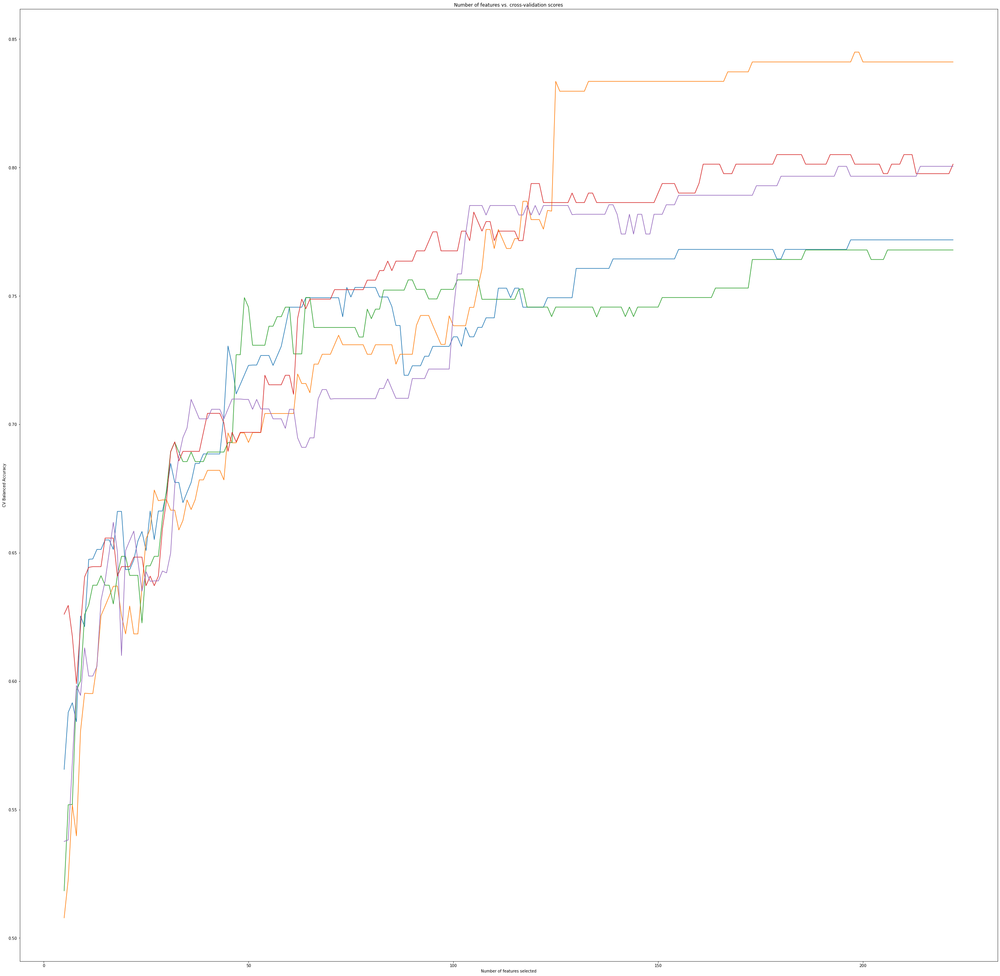

In [34]:
rfecv = RFECV(estimator = gscv_lda.best_estimator_,
              min_features_to_select = 5,
              scoring = "balanced_accuracy",
              n_jobs = -3)
%time rfecv = rfecv.fit(X_train, y_train_le)

print("Optimal number of features: {}".format(rfecv.n_features_))

plt.figure(figsize = (45, 45))
plt.title("Number of features vs. cross-validation scores")
plt.xlabel("Number of features selected")
plt.ylabel("CV Balanced Accuracy")
plt.plot(range(5, len(rfecv.grid_scores_) + 5),
         rfecv.grid_scores_)
plt.show()

In [35]:
# where "felda" = feature_eliminated_lda
felda_cols = X_train.columns[rfecv.support_]

%time gscv_lda.fit(X = X_train[felda_cols], y = y_train_le)
pred_train_felda = gscv_lda.best_estimator_.predict(X_train[felda_cols])
pred_test_felda = gscv_lda.best_estimator_.predict(X_test[felda_cols])

print("### FEATURE ELIMINATED LDA ###")
print("Best score and estimator:\n-------------------------")
print(gscv_lda.best_score_, gscv_lda.best_estimator_, "\n")
print("Balanced accuracy train:", balanced_accuracy_score(y_train_le, pred_train_felda))
print("Balanced accuracy test:", balanced_accuracy_score(y_test_le, pred_test_felda))

CPU times: total: 125 ms
Wall time: 213 ms
### FEATURE ELIMINATED LDA ###
Best score and estimator:
-------------------------
0.7942368742368742 LinearDiscriminantAnalysis(shrinkage='auto', solver='lsqr') 

Balanced accuracy train: 0.8164179104477611
Balanced accuracy test: 0.7984848484848485


#### LDA + RFE Validation

In [36]:
lda_final_preds = gscv_lda.best_estimator_.predict(ftest_X[felda_cols])
print("### LDA VALIDATION ###")
print("Final result: ", balanced_accuracy_score(ftest_y_le, lda_final_preds))

### LDA VALIDATION ###
Final result:  0.8688888888888889


### 1.2: Quadratic DA

In [37]:
qda_params = [{'reg_param': [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7]}]
qda = QuadraticDiscriminantAnalysis()

gscv_qda = GridSearchCV(estimator = qda,
                        param_grid = qda_params,
                        n_jobs = -3,
                        cv = 5,
                        scoring = "balanced_accuracy")

In [38]:
%time gscv_qda.fit(X = X_train, y = y_train_le)
pred_train_qda = gscv_qda.best_estimator_.predict(X_train)
pred_test_qda = gscv_qda.best_estimator_.predict(X_test)

print("### QUADRATIC DISCRIMINANT ANALYSIS ###")
print("Best score and estimator:\n-------------------------")
print(gscv_qda.best_score_, gscv_qda.best_estimator_, "\n")
print("Balanced accuracy train:", balanced_accuracy_score(y_train_le, pred_train_qda))
print("Balanced accuracy test:", balanced_accuracy_score(y_test_le, pred_test_qda))

CPU times: total: 953 ms
Wall time: 378 ms
### QUADRATIC DISCRIMINANT ANALYSIS ###
Best score and estimator:
-------------------------
0.7459544159544159 QuadraticDiscriminantAnalysis(reg_param=0.1) 

Balanced accuracy train: 0.7895522388059701
Balanced accuracy test: 0.7696969696969698


QDA might not have posted an error here but the console screams "variables are collinear". Regularisation notwithstanding, this is where clustering based on collinearity would help. The SVC and tree-based classifiers aren't really affected by multicollinearity though, so let's try them out and see how we do.

### RFE won't work with QDA
Because sklearn's implementation doesn't actually have either a `coef_` or `feature_importances_` attribute. In which case let's just use all of the features for validation.

#### QDA Validation

In [39]:
qda_final_preds = gscv_qda.best_estimator_.predict(ftest_X[X_test.columns])
print("### QDA VALIDATION ###")
print("Final result: ", balanced_accuracy_score(ftest_y_le, qda_final_preds))

### QDA VALIDATION ###
Final result:  0.9022222222222221


## Model 2: SVC (GridSearch)
As mentioned earlier, SVC is heavily affected by unscaled data, so we'll be using `MinMaxScaler()` for this for the following reasons:
1. StandardScaler() standardises data to have `0` mean and unit variance (z-scoring data removes the mean). This is great but it assumes the data is normally distributed which a good portion of our data isn't. Standardising it will emphasise our abnormally distributed data and will also not contribute much to restricting our decision boundary to small enough values.
2. RobustScaler(), although exceptionally awesome because it uses the median instead of the mean and is unaffected by outliers, compounds the abnormal distribution even more and also results in even larger values for outliers.
3. MinMaxScaler() scales data to unit variance (normalises the data) which addresses outliers, doesn't emphasise abnormal distributions and restricts our decision boundary to `[-1, 1]` (default = `[0, 1]`). This will help our SVM tremendously by easing its computational burden.

The difference in scales will be demonstrated with graphs, but the SVM will be run after normalising.

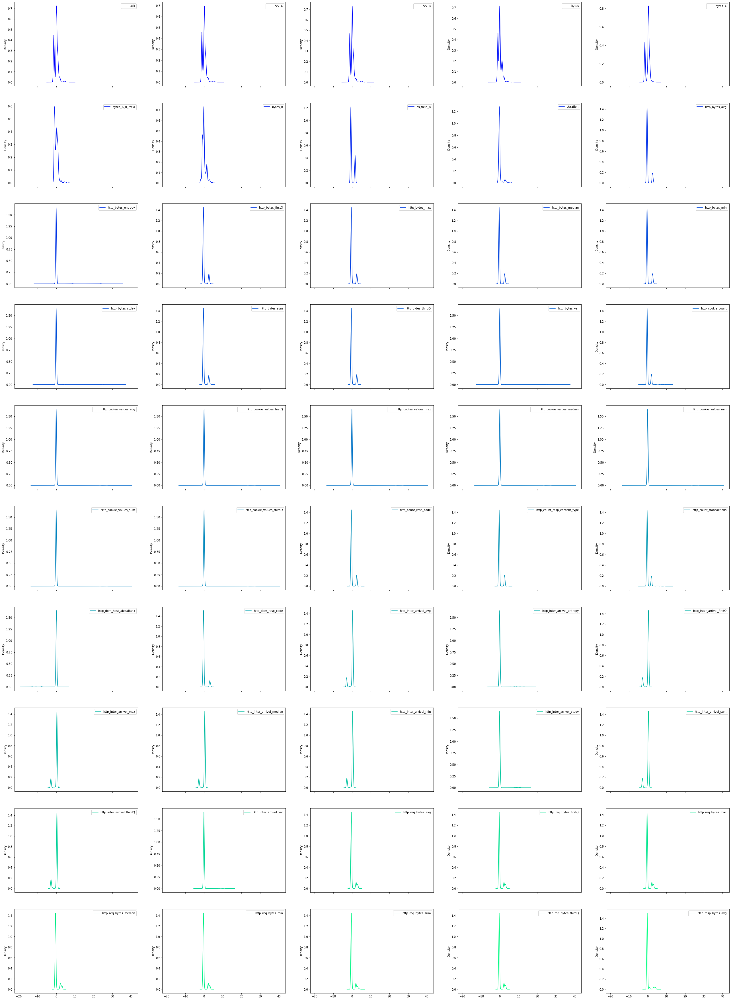

In [40]:
std_scale = StandardScaler()

std_scale.fit(X_train)
X_train_std = std_scale.transform(X_train)
X_test_std = std_scale.transform(X_test)

(pd.DataFrame(X_train_std,
              columns = X_train.columns)).iloc[:, :50].plot.kde(subplots = True,
                                                                figsize = (45, 90),
                                                                layout = (14, 5),
                                                                colormap = "winter");

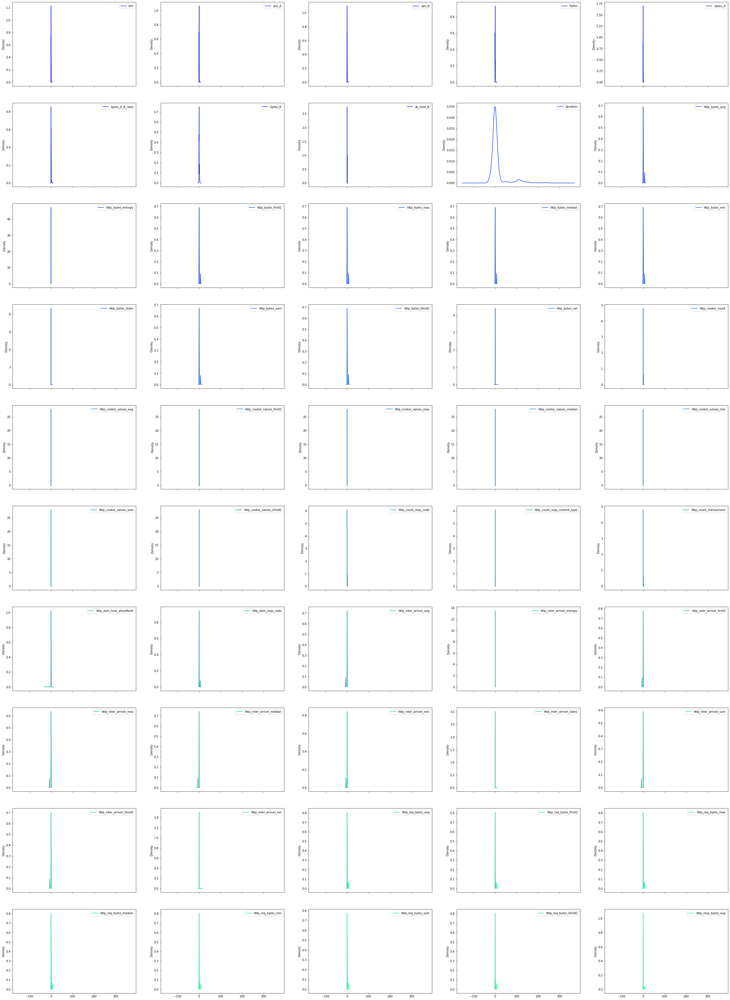

In [41]:
rob_scale = RobustScaler()

rob_scale.fit(X_train)
X_train_rob = rob_scale.transform(X_train)
X_test_rob = rob_scale.transform(X_test)

(pd.DataFrame(X_train_rob,
              columns = X_train.columns)).iloc[:, :50].plot.kde(subplots = True,
                                                                figsize = (45, 90),
                                                                layout = (14, 5),
                                                                colormap = "winter");

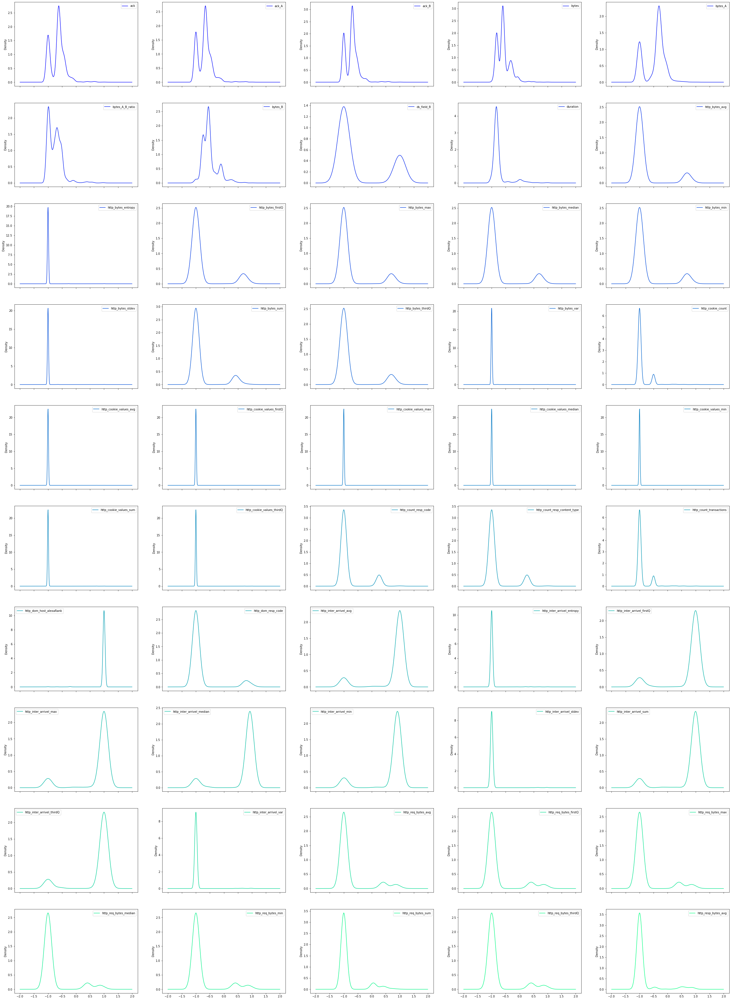

In [42]:
mmx_scale = MinMaxScaler(feature_range = (-1, 1))

mmx_scale.fit(X_train)
X_train_mmx = mmx_scale.transform(X_train)
X_test_mmx = mmx_scale.transform(X_test)

(pd.DataFrame(X_train_mmx,
              columns = X_train.columns)).iloc[:, :50].plot.kde(subplots = True,
                                                                figsize = (45, 90),
                                                                layout = (14, 5),
                                                                colormap = "winter");

In [43]:
svc_params = [{"C": [0.001, 0.01, 0.1, 1, 2, 5, 10],
               "kernel": ["linear", "rbf", "sigmoid", "poly"],
               # up to 10 degrees because we have 10 classification labels
               # not particularly ingenious, but ¯\_(ツ)_/¯
               "degree": [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
               "gamma": ["scale", "auto"],
               "decision_function_shape": ["ovr", "ovo"],
               "random_state": [1337]}]
svc = SVC()

gscv_svc = GridSearchCV(estimator = svc,
                        param_grid = svc_params,
                        n_jobs = -3,
                        cv = 5,
                        scoring = "balanced_accuracy",
                        verbose = 3)

In [44]:
%time gscv_svc.fit(X = X_train_mmx, y = y_train_le)
pred_train_mmx = gscv_svc.best_estimator_.predict(X_train_mmx)
pred_test_mmx = gscv_svc.best_estimator_.predict(X_test_mmx)

print("### SVC NORMALISED ###")
print("Best score and estimator:\n-------------------------")
print(gscv_svc.best_score_, gscv_svc.best_estimator_, "\n")
print("Balanced accuracy train:", balanced_accuracy_score(y_train_le, pred_train_mmx))
print("Balanced accuracy test:", balanced_accuracy_score(y_test_le, pred_test_mmx))

Fitting 5 folds for each of 1120 candidates, totalling 5600 fits
CPU times: total: 6.22 s
Wall time: 1min 11s
### SVC NORMALISED ###
Best score and estimator:
-------------------------
0.8202767602767602 SVC(C=10, degree=1, kernel='linear', random_state=1337) 

Balanced accuracy train: 0.8559701492537313
Balanced accuracy test: 0.8378787878787879


#### SVC Validation
Without feature selection.

In [45]:
svc_final_preds = gscv_svc.best_estimator_.predict(mmx_scale.transform(ftest_X[X_train.columns]))
print("### SVC VALIDATION ###")
print("Final result: ", balanced_accuracy_score(ftest_y_le, svc_final_preds))

### SVC VALIDATION ###
Final result:  0.8966666666666667


### SVC + RFE  
Don't forget to fit `rfecv` on ***normalised*** data!

CPU times: total: 3.5 s
Wall time: 8.79 s
Optimal number of features: 69


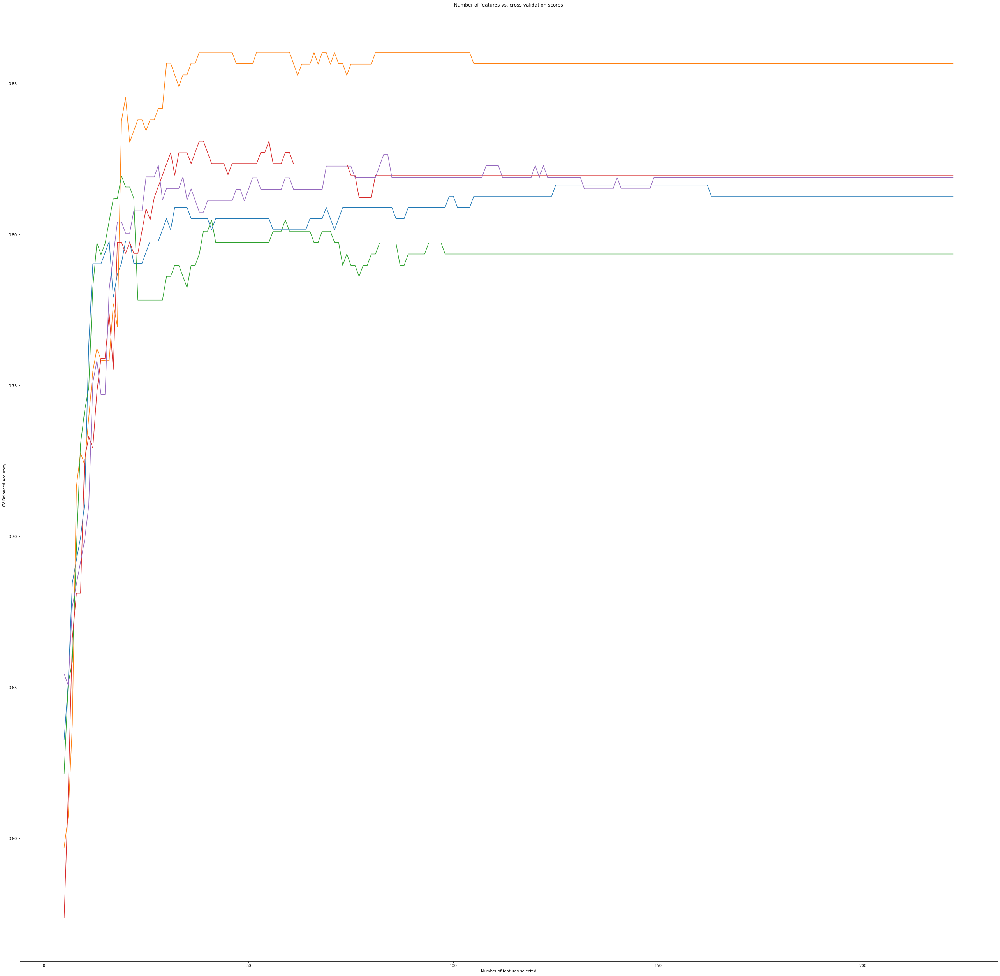

In [46]:
rfecv = RFECV(estimator = gscv_svc.best_estimator_,
              min_features_to_select = 5,
              scoring = "balanced_accuracy",
              n_jobs = -3)
%time rfecv = rfecv.fit(X_train_mmx, y_train_le)

print("Optimal number of features: {}".format(rfecv.n_features_))

plt.figure(figsize = (45, 45))
plt.title("Number of features vs. cross-validation scores")
plt.xlabel("Number of features selected")
plt.ylabel("CV Balanced Accuracy")
plt.plot(range(5, len(rfecv.grid_scores_) + 5),
         rfecv.grid_scores_)
plt.show()

In [47]:
# where "fesvc" = feature_eliminated_svc
fesvc_cols = X_train.columns[rfecv.support_]

mmx_scale_fesvc = MinMaxScaler(feature_range = (-1, 1))
X_train_femmx = mmx_scale_fesvc.fit_transform(X_train[fesvc_cols])
X_test_femmx = mmx_scale_fesvc.transform(X_test[fesvc_cols])

%time gscv_svc.fit(X = X_train_femmx, y = y_train_le)
pred_train_fesvc = gscv_svc.best_estimator_.predict(X_train_femmx)
pred_test_fesvc = gscv_svc.best_estimator_.predict(X_test_femmx)

print("### FEATURE ELIMINATED SVC ###")
print("Best score and estimator:\n-------------------------")
print(gscv_svc.best_score_, gscv_svc.best_estimator_, "\n")
print("Balanced accuracy train:", balanced_accuracy_score(y_train_le, pred_train_fesvc))
print("Balanced accuracy test:", balanced_accuracy_score(y_test_le, pred_test_fesvc))

Fitting 5 folds for each of 1120 candidates, totalling 5600 fits
CPU times: total: 3.64 s
Wall time: 41.6 s
### FEATURE ELIMINATED SVC ###
Best score and estimator:
-------------------------
0.8240374440374441 SVC(C=10, degree=1, kernel='linear', random_state=1337) 

Balanced accuracy train: 0.8559701492537313
Balanced accuracy test: 0.8424242424242424


#### SVC + RFE Validation

In [48]:
svc_final_preds = gscv_svc.best_estimator_.predict(mmx_scale_fesvc.transform(ftest_X[fesvc_cols]))
print("### SVC VALIDATION ###")
print("Final result: ", balanced_accuracy_score(ftest_y_le, svc_final_preds))

### SVC VALIDATION ###
Final result:  0.8599999999999999


## Model 3: XGBoost (GridSearch)

In [49]:
xgb_params = {"colsample_bytree": [0.25, 0.50, 0.75, 1],
              "learning_rate": [0.2, 0.3, 0.5, 1],
              "gamma": [0.25, 0.50, 0.75, 1],
              "reg_lambda": [0.25, 0.50, 0.75, 1],
              "max_depth": [5, 4, 3, 2],
              "n_estimators": [1000],
              "random_state": [1337],
              "grow_policy": ["lossguide"],
              "objective": ["multi:softprob"],
              "eval_metric": ["auc"]}
xgb = XGBClassifier(use_label_encoder = False)

gscv_xgb = GridSearchCV(estimator = xgb,
                        param_grid = xgb_params,
                        n_jobs = -3,
                        cv = 5,
                        scoring = "balanced_accuracy",
                        verbose = 3)

In [50]:
%time gscv_xgb.fit(X = X_train, y = y_train_le)
pred_train_xgb = gscv_xgb.best_estimator_.predict(X_train)
pred_test_xgb = gscv_xgb.best_estimator_.predict(X_test)

print("### NORMALISED STANDARDSCALED DATA ###")
print("Best score and estimator:\n-------------------------")
print(gscv_xgb.best_score_, gscv_xgb.best_estimator_, "\n")
print("Balanced accuracy train:", balanced_accuracy_score(y_train_le, pred_train_xgb))
print("Balanced accuracy test:", balanced_accuracy_score(y_test_le, pred_test_xgb))

Fitting 5 folds for each of 1024 candidates, totalling 5120 fits
CPU times: total: 1min 33s
Wall time: 5h 15min 43s
### NORMALISED STANDARDSCALED DATA ###
Best score and estimator:
-------------------------
0.8559788359788358 XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
              eval_metric='auc', gamma=0.75, gpu_id=-1, grow_policy='lossguide',
              importance_type=None, interaction_constraints='',
              learning_rate=0.3, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=1000, n_jobs=12, num_parallel_tree=1,
              objective='multi:softprob', predictor='auto', random_state=1337,
              reg_alpha=0, reg_lambda=0.25, scale_pos_weight=None, subsample=1,
              tree_method='exact', use_label_encoder=False, ...) 

Balanced accuracy train: 0.9694029850746269
Balance

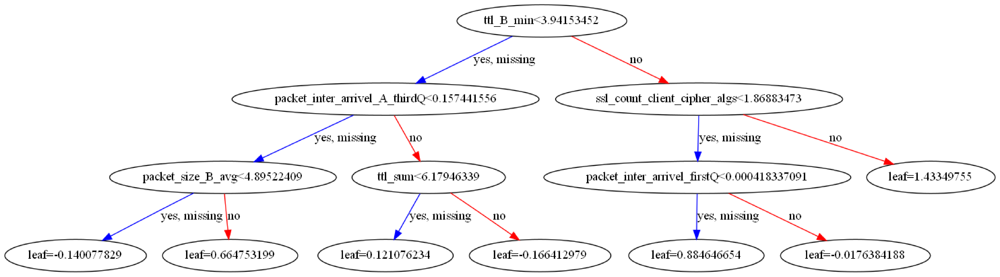

In [51]:
rcParams['figure.figsize'] = 90, 45
plot_tree(gscv_xgb.best_estimator_);

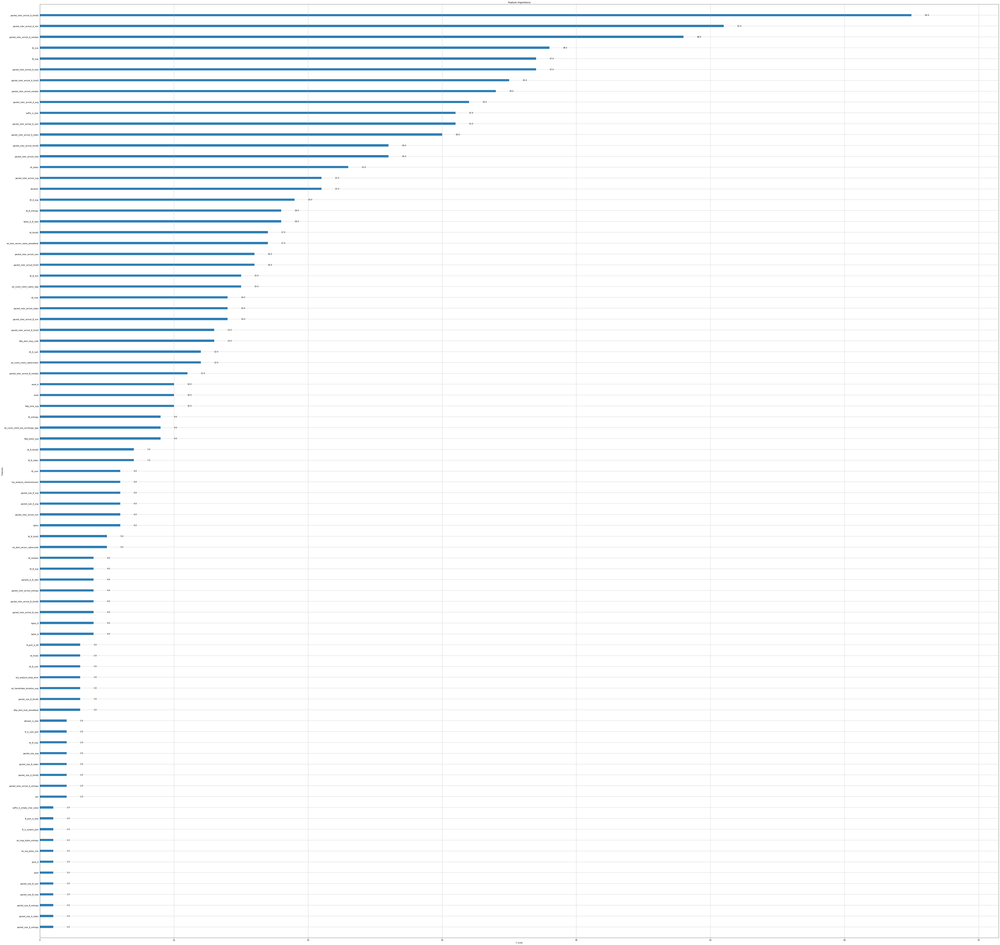

In [52]:
rcParams['figure.figsize'] = 90, 90
plot_importance(gscv_xgb.best_estimator_);

#### XGB Validation
Without feature selection.

In [53]:
xgb_final_preds = gscv_xgb.best_estimator_.predict(ftest_X[X_test.columns])
print("### XGB VALIDATION ###")
print("Final result: ", balanced_accuracy_score(ftest_y_le, xgb_final_preds))

### XGB VALIDATION ###
Final result:  0.9566666666666668


### XGB + RFE

CPU times: total: 1h 9min 38s
Wall time: 1h 6min 41s
Optimal number of features: 164


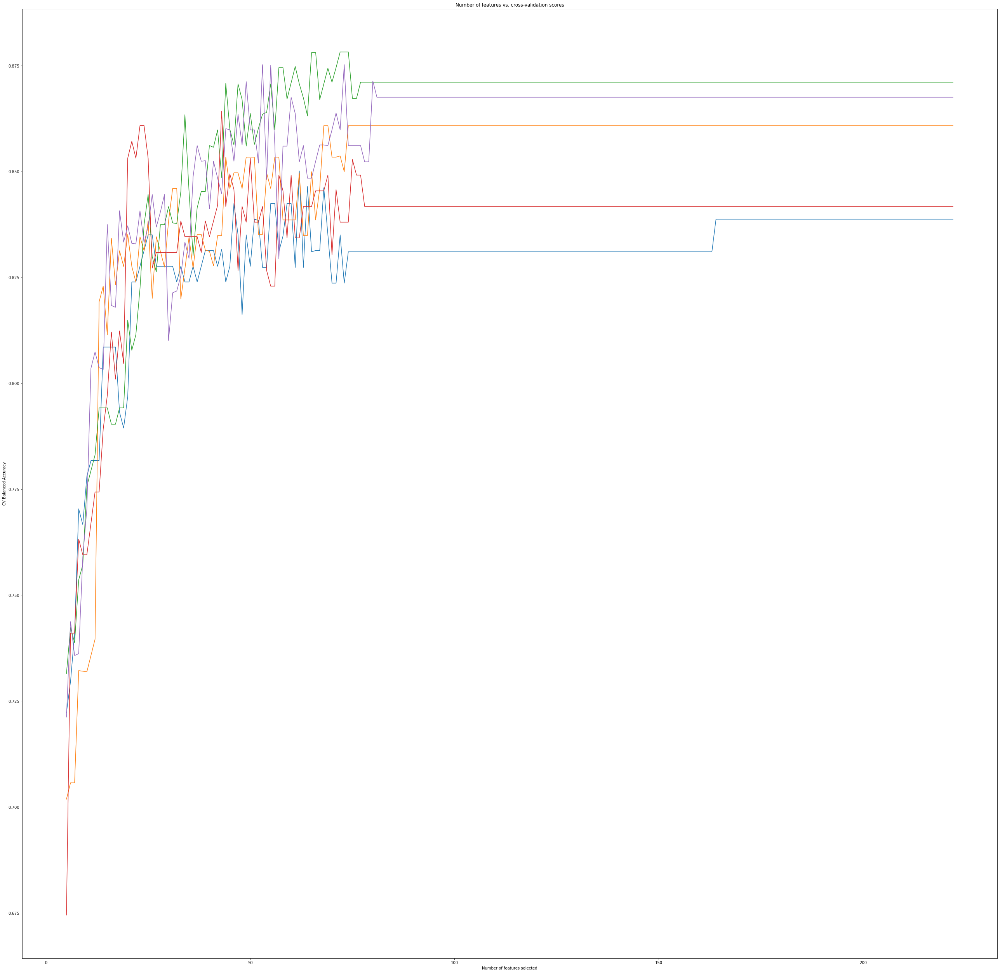

In [54]:
rfecv = RFECV(estimator = gscv_xgb.best_estimator_,
              min_features_to_select = 5,
              scoring = "balanced_accuracy",
              n_jobs = -3)
%time rfecv = rfecv.fit(X_train, y_train_le)

print("Optimal number of features: {}".format(rfecv.n_features_))

plt.figure(figsize = (45, 45))
plt.title("Number of features vs. cross-validation scores")
plt.xlabel("Number of features selected")
plt.ylabel("CV Balanced Accuracy")
plt.plot(range(5, len(rfecv.grid_scores_) + 5),
         rfecv.grid_scores_)
plt.show()

In [55]:
# where "fexgb" = feature_eliminated_xgb
fexgb_cols = X_train.columns[rfecv.support_]

%time gscv_xgb.fit(X = X_train[fexgb_cols], y = y_train_le)
pred_train_fexgb = gscv_xgb.best_estimator_.predict(X_train[fexgb_cols])
pred_test_fexgb = gscv_xgb.best_estimator_.predict(X_test[fexgb_cols])

print("### FEATURE ELIMINATED XGB ###")
print("Best score and estimator:\n-------------------------")
print(gscv_xgb.best_score_, gscv_xgb.best_estimator_, "\n")
print("Balanced accuracy train:", balanced_accuracy_score(y_train_le, pred_train_fexgb))
print("Balanced accuracy test:", balanced_accuracy_score(y_test_le, pred_test_fexgb))

Fitting 5 folds for each of 1024 candidates, totalling 5120 fits
CPU times: total: 44.8 s
Wall time: 4h 23min 41s
### FEATURE ELIMINATED XGB ###
Best score and estimator:
-------------------------
0.855929995929996 XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.25,
              enable_categorical=False, eval_metric='auc', gamma=0.25,
              gpu_id=-1, grow_policy='lossguide', importance_type=None,
              interaction_constraints='', learning_rate=0.3, max_delta_step=0,
              max_depth=4, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=1000, n_jobs=12,
              num_parallel_tree=1, objective='multi:softprob', predictor='auto',
              random_state=1337, reg_alpha=0, reg_lambda=0.25,
              scale_pos_weight=None, subsample=1, tree_method='exact',
              use_label_encoder=False, ...) 

Balanced accuracy train: 1.0
Balanced accurac

Small note: this fitting of XGB actually took almost 19800 seconds (330 minutes, 5h 30m)
#### XGB + RFE Validation

In [58]:
xgb_final_preds = gscv_xgb.best_estimator_.predict(ftest_X[fexgb_cols])
print("### XGB VALIDATION ###")
print("Final result: ", balanced_accuracy_score(ftest_y_le, xgb_final_preds))

### XGB VALIDATION ###
Final result:  0.9633333333333334


## Model building round 1: Summary
Reassuring results: all of our classifiers worked rather well with log transformed data, and RFE was the frosting on the proverbial crepe. Some interesting takeaways:
1. As our common sense told and tells us, feature selection results in loss of generality (so does outlier removal, unless both techniques are inherent requirements of the analysis being carried out.) This can be very clearly seen in the slightly worse performance of the models after performing RFE. However, the drop in performance is negligible and if it's accompanied with a strong reduction in dimensionality (as in the case of our SVC), it might be well worth it depending on the model's use case (for example, an edge machine learner device would require a model that uses  the smallest amount of space.) In this case however (and generally as much as possible) I personally prefer to keep as much as data intact as possible, and so would choose to regularise rather than reduce.
2. QDA performed better than LDA did, which adds credibility to the assumption that our data is not linearly separable. Whether this is truly the case or is an artifact of dimensionality is debatable, but nevertheless both classifers performed quite satisfactorily.
2. The SVM responded well to normalised data, but did so rather surprisingly with a C value of 10 and a linear kernel. The highest C value out of the bunch shouldn't be too unexpected: the higher C is, the more the SVM attempts to perfect its classification; but the linear kernel lends credibility to the argument that our data probably is linearly separable in some higher dimension. This also might back up our QDA classifier's performance: the data is not linearly separable in a 2D plane.
3. XGB quite unsurprisingly performed the best, not only on training data but also in its generalisation to unseen data - it even outperformed the other models after RFE!

We probably could just end this entire exercise here and call it a month, but let's indulge our curiosity and see how our performance changes with clustering and then some non-linear dimensionality reduction (not sequentially: NLDR performs clustering as part of its various methods.) These activities will be done over upcoming instalments.